# End-to-End Pipeline

<br>

### Imports

In [1]:
import xarray as xr

from satip import eumetsat, reproj, io

import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import os
import dotenv

<br>

### User Inputs

In [2]:
data_dir = '../data/raw'
sorted_dir = '../data/sorted'
debug_fp = '../logs/EUMETSAT_download.txt'
env_vars_fp = '../.env'
metadata_db_fp = '../data/EUMETSAT_metadata.db'
new_grid_fp='../data/intermediate/new_grid_4km_TM.json'
new_coords_fp = '../data/intermediate/reproj_coords_TM_4km.csv'
zarr_bucket = 'solar-pv-nowcasting-data/satellite/EUMETSAT/SEVIRI_RSS/full_extent_TM_zarr_int16'

<br>

### Loading Environment Variables

In [3]:
dotenv.load_dotenv(env_vars_fp)

user_key = os.environ.get('USER_KEY')
user_secret = os.environ.get('USER_SECRET')
slack_id = os.environ.get('SLACK_ID')
slack_webhook_url = os.environ.get('SLACK_WEBHOOK_URL')

In [4]:
dm = eumetsat.DownloadManager(user_key, user_secret, data_dir, metadata_db_fp, debug_fp)

start_date = '2019-01-01 12:00'
end_date = '2019-01-01 12:05'

dm.download_datasets(start_date, end_date)

2020-12-01 19:48:38,642 - INFO - ********** Download Manager Initialised **************
2020-12-01 19:48:39,169 - INFO - 1 files queried, 0 found in ../data/raw, 1 to download.


 [████████████████████████████████████████████████████████████] 1/1 [00:12<00:12, 11.90s/it]

In [5]:
df_metadata = dm.get_df_metadata()

df_metadata.head()

,start_date,end_date,result_time,platform_short_name,platform_orbit_type,instrument_name,sensor_op_mode,center_srs_name,center_position,file_name,file_size,missing_pct,downloaded
id,,,,,,,,,,,,,
1,2020-10-01 12:05:09.428,2020-10-01 12:09:15.775,2020-10-01 12:09:15.775,MSG3,GEO,SEVIRI,RSS,EPSG:4326,0 9.5,MSG3-SEVI-MSG15-0100-NA-20201001120915.7750000...,99819,0.0,2020-11-13 10:32:40.853958
2,2020-10-01 12:10:09.249,2020-10-01 12:14:15.596,2020-10-01 12:14:15.596,MSG3,GEO,SEVIRI,RSS,EPSG:4326,0 9.5,MSG3-SEVI-MSG15-0100-NA-20201001121415.5960000...,99819,0.0,2020-11-13 10:32:56.874131
3,2020-10-01 12:15:09.071,2020-10-01 12:19:15.417,2020-10-01 12:19:15.417,MSG3,GEO,SEVIRI,RSS,EPSG:4326,0 9.5,MSG3-SEVI-MSG15-0100-NA-20201001121915.4170000...,99819,0.0,2020-11-13 10:33:13.998136
4,2020-10-01 12:20:08.892,2020-10-01 12:24:15.239,2020-10-01 12:24:15.239,MSG3,GEO,SEVIRI,RSS,EPSG:4326,0 9.5,MSG3-SEVI-MSG15-0100-NA-20201001122415.2390000...,99819,0.0,2020-11-13 10:33:30.656217
5,2020-10-01 12:25:08.714,2020-10-01 12:29:15.060,2020-10-01 12:29:15.060,MSG3,GEO,SEVIRI,RSS,EPSG:4326,0 9.5,MSG3-SEVI-MSG15-0100-NA-20201001122915.0600000...,99819,0.0,2020-11-13 10:33:46.352754


C:\Users\Ayrto\anaconda3\envs\satip_dev\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()
C:\Users\Ayrto\anaconda3\envs\satip_dev\lib\site-packages\pyproj\crs\crs.py:543: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj_string = self.to_proj4()


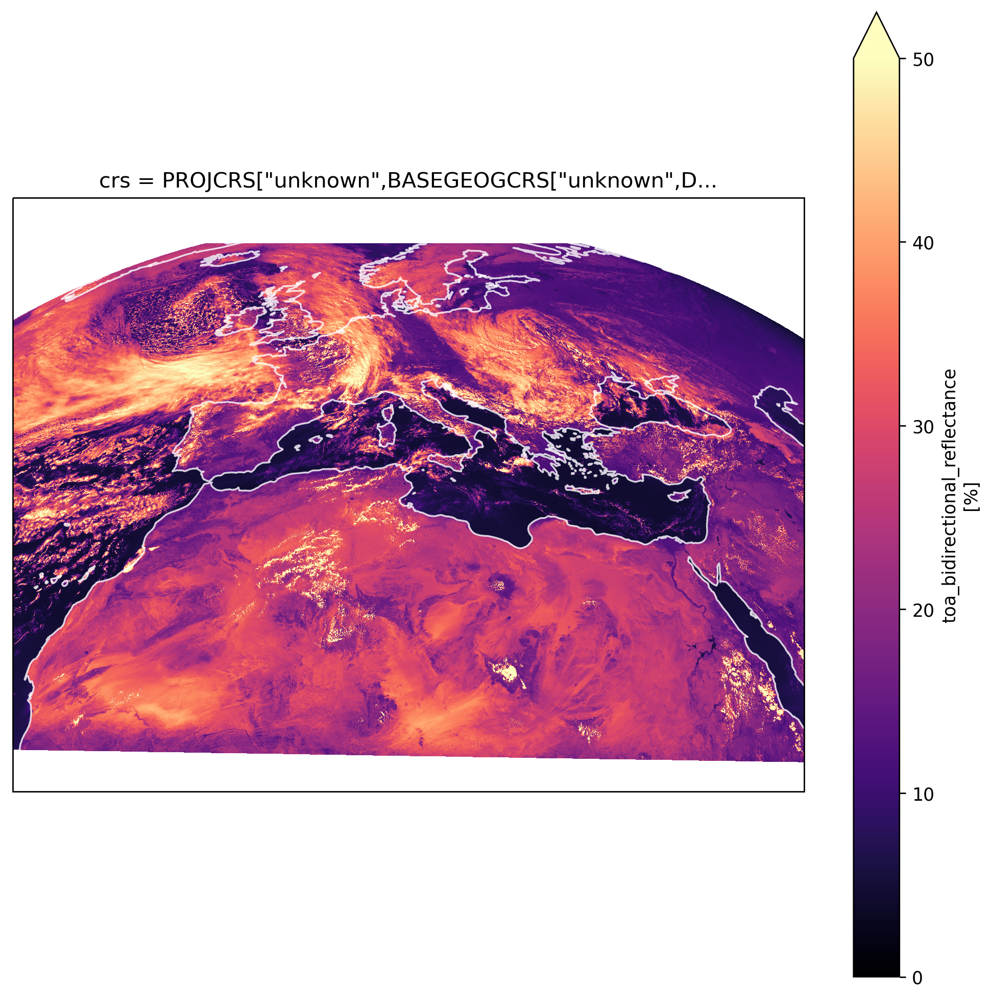

In [6]:
filename = df_metadata.loc[6, 'file_name']
native_fp = f'{data_dir}/{filename}.nat'

severi_area_def = reproj.get_seviri_area_def(native_fp)
seviri_crs = severi_area_def.to_cartopy_crs()

scene = reproj.load_scene(native_fp)
scene.load(['HRV'])

# Plotting
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=seviri_crs)

scene['HRV'].plot.imshow(ax=ax, cmap='magma', vmin=0, vmax=50)

ax.coastlines(resolution='50m', alpha=0.8, color='white')

In [7]:
%%capture --no-stdout
%%time

reprojector = reproj.Reprojector(new_coords_fp, new_grid_fp)
ds_reproj = reprojector.reproject(native_fp, reproj_library='pyinterp')

Wall time: 7.55 s


<ipython-input-8-4e8ea5206667>:3: UserWarning: The default value for the *approx* keyword argument to TransverseMercator will change from True to False after 0.18.
  ax = plt.axes(projection=ccrs.TransverseMercator())


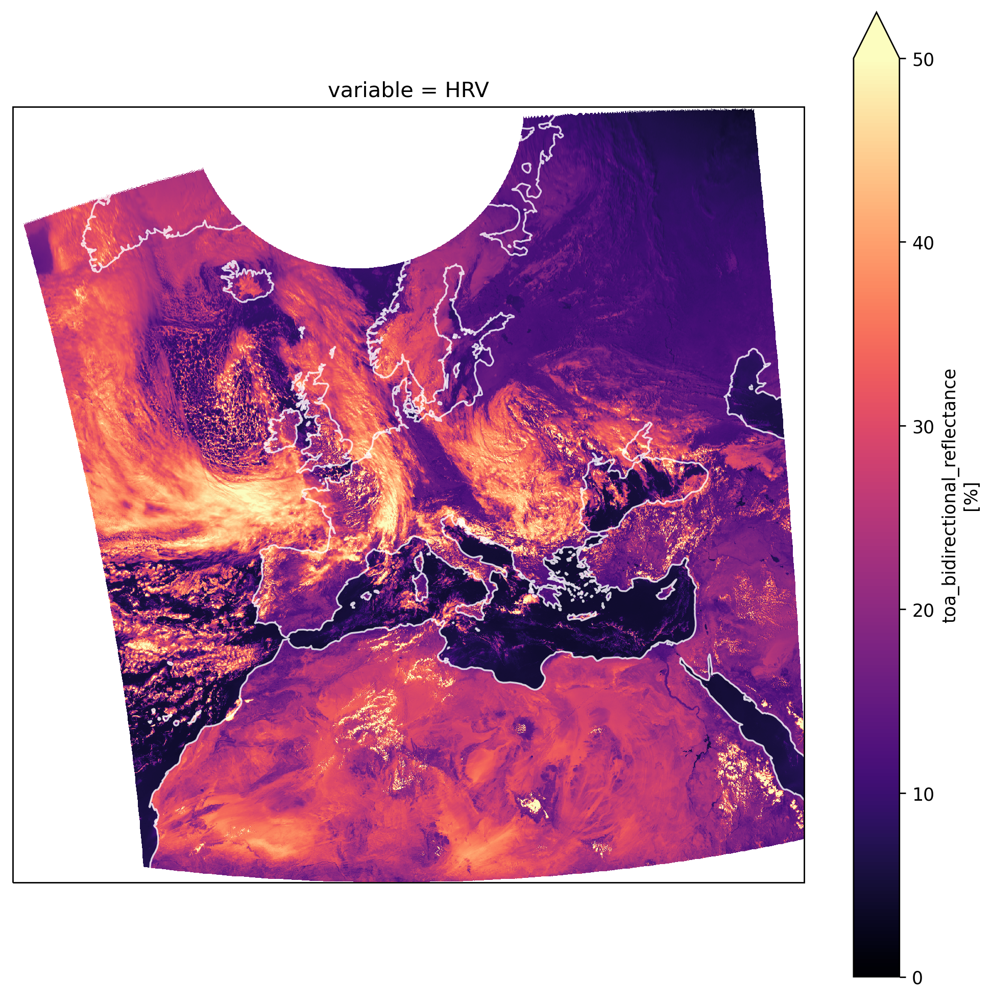

In [8]:
# Plotting
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=ccrs.TransverseMercator())

ds_reproj['stacked_eumetsat_data'].sel(variable='HRV').plot.imshow(ax=ax, cmap='magma', vmin=0, vmax=50)

ax.coastlines(resolution='50m', alpha=0.8, color='white')

In [9]:
%%time

compressor = io.Compressor()

da_compressed = compressor.compress(ds_reproj['stacked_eumetsat_data'])

Wall time: 3.36 s


<ipython-input-10-513229c54fcb>:3: UserWarning: The default value for the *approx* keyword argument to TransverseMercator will change from True to False after 0.18.
  ax = plt.axes(projection=ccrs.TransverseMercator())


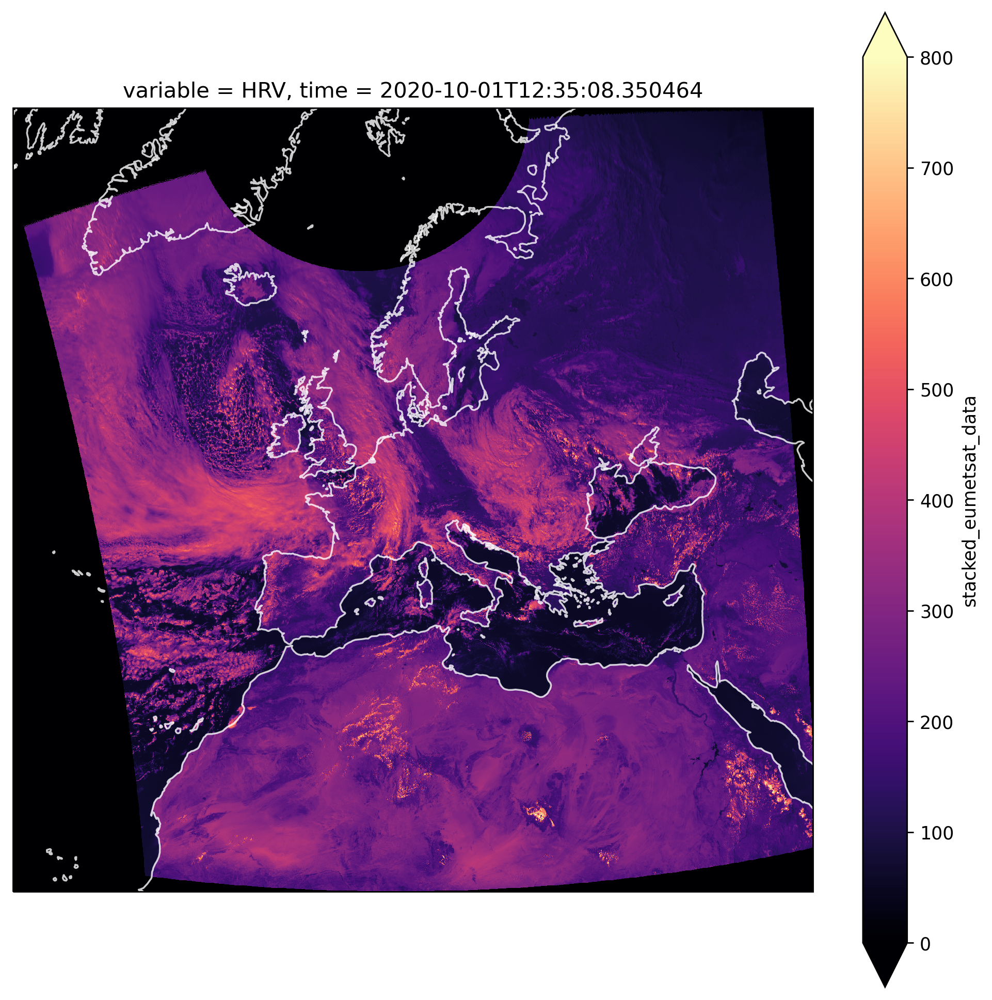

In [10]:
# Plotting
fig = plt.figure(dpi=250, figsize=(10, 10))
ax = plt.axes(projection=ccrs.TransverseMercator())

da_compressed.sel(variable='HRV').isel(time=0).plot.imshow(ax=ax, vmin=0, vmax=800, cmap='magma')

ax.coastlines(resolution='50m', alpha=0.8, color='white')

In [11]:
# Flatten attributes
# Use dagster to just run this notebook on GitHub actions
# Add option to just pass the ds through the full pipeline

In [12]:
%%time

io.save_da_to_zarr(da_compressed, zarr_bucket)

C:\Users\Ayrto\anaconda3\envs\satip_dev\lib\site-packages\google\auth\_default.py:69: UserWarning: Your application has authenticated using end user credentials from Google Cloud SDK without a quota project. You might receive a "quota exceeded" or "API not enabled" error. We recommend you rerun `gcloud auth application-default login` and make sure a quota project is added. Or you can use service accounts instead. For more information about service accounts, see https://cloud.google.com/docs/authentication/
  warnings.warn(_CLOUD_SDK_CREDENTIALS_WARNING)
C:\Users\Ayrto\anaconda3\envs\satip_dev\lib\site-packages\xarray\core\dataset.py:1652: SerializationWarning: saving variable None with floating point data as an integer dtype without any _FillValue to use for NaNs
  return to_zarr(


Wall time: 3min 6s


In [13]:
io.load_from_zarr_bucket(zarr_bucket)

<xarray.Dataset>
Dimensions:                (time: 2, variable: 12, x: 1870, y: 1831)
Coordinates:
  * time                   (time) datetime64[ns] 2020-01-01T12:05:10.468850 2...
  * variable               (variable) object 'HRV' 'IR_016' ... 'WV_073'
  * x                      (x) float64 4.388e+06 4.384e+06 ... -3.088e+06
  * y                      (y) float64 1.692e+06 1.696e+06 ... 9.012e+06
Data variables:
    stacked_eumetsat_data  (time, x, y, variable) int16 dask.array<chunksize=(2, 1870, 1831, 1), meta=np.ndarray>

In [14]:
'2019-01-01T12:05:09.898452000'

'2019-01-01T12:05:09.898452000'